## Decision Trees (Arboles de Decisión)

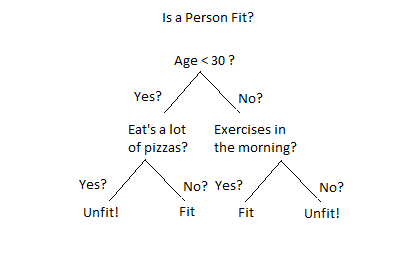

Los Arboles de Decisión (o Decision Trees) es un algoritmos de regresión y clasificación basado en condicionales.

Se construyen utilizando dos tipos de elementos: **nodos y ramas**. En cada nodo, se evalúa una de las características (atributo) de nuestros datos para dividir las observaciones en el proceso de entrenamiento o para hacer que un punto de datos específico siga un camino determinado al hacer una predicción.

Cuando se están generando, los árboles de decisión se construyen evaluando recursivamente diferentes características (atributos) y utilizando en cada nodo la característica que mejor divide los datos.

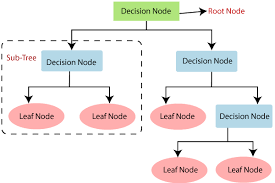

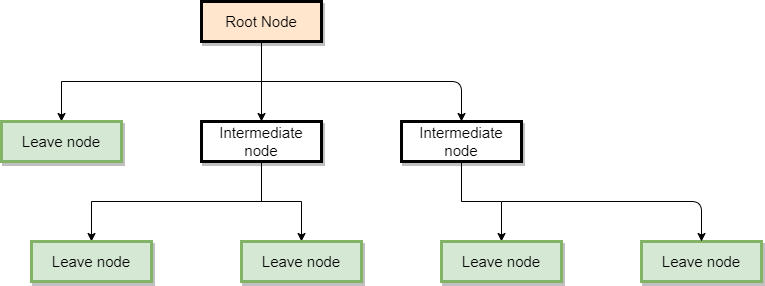


___

- **El nodo raíz (root node)**: Es el nodo que inicia el grafo. En un árbol de decisión normal evalúa la variable que mejor divide los datos.



- **Los nodos intermedios (nodes)**: Son nodos donde se evalúan variables pero que no son los nodos finales donde se realizan las predicciones.



- **Los nodos hoja (leaf node)**: Son los nodos finales del árbol, donde se realizan las predicciones de una categoría o un valor numérico.


Los árboles de decisión se construyen dividiendo recursivamente las muestras del conjunto de entrenamiento utilizando una función de error. Esto se hace evaluando ciertas métricas, como el **índice de Gini** o la **Entropía** para árboles de decisión categóricos, o el **error cuadrático medio** o **error Residual** para árboles de regresión.

_**Documentación:** https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html_

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets

# Normalizacion
from sklearn.preprocessing import MinMaxScaler

# Train, Test
from sklearn.model_selection import train_test_split

# Metricas
from sklearn.metrics import jaccard_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Modelo
from sklearn.tree import DecisionTreeClassifier

In [2]:
df = pd.read_csv("../Data/titcanica.csv")
X = np.array(df.drop(["Survived", "PassengerId", "Ticket", "Name"], axis = 1))
y = np.array(df["Survived"])

### **TRAIN Y TEST**

In [3]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")

X_train: (623, 6), y_train: (623,)
X_test: (268, 6),  y_test: (268,)


### **PROCESAMIENTO DE DATOS**

In [4]:
# Normalización de datos
x_scaler = MinMaxScaler()
X_train = x_scaler.fit_transform(X_train)
X_test = x_scaler.fit_transform(X_test)

### **MODELO**

In [6]:
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

### **PREDICCIONES**

In [7]:
yhat = model.predict(X_test)

In [8]:
print("Jaccard Index:", jaccard_score(y_test, yhat, average = "macro"))
print("Accuracy:"     , accuracy_score(y_test, yhat))
print("Precisión:"    , precision_score(y_test, yhat, average = "macro"))
print("Sensibilidad:" , recall_score(y_test, yhat, average = "macro"))
print("F1-score:"     , f1_score(y_test, yhat, average = "macro"))

Jaccard Index: 0.5671043165467626
Accuracy: 0.7350746268656716
Precisión: 0.7172208013640239
Sensibilidad: 0.736042490118577
F1-score: 0.7205996798966272


### **Confusion Matrix**

In [9]:
confusion_matrix(y_test, yhat, labels = [0, 1, 2])

array([[129,  47,   0],
       [ 24,  68,   0],
       [  0,   0,   0]], dtype=int64)

### **Classification Report**

In [10]:
print(classification_report(y_test, yhat, digits = 3))

              precision    recall  f1-score   support

           0      0.843     0.733     0.784       176
           1      0.591     0.739     0.657        92

    accuracy                          0.735       268
   macro avg      0.717     0.736     0.721       268
weighted avg      0.757     0.735     0.741       268



### **Atributos y Métodos**

In [11]:
# .predict_proba()
model.predict_proba(X_test)

array([[0.        , 1.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.25      , 0.75      ],
       [0.        , 1.        ],
       [0.25      , 0.75      ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [1.

In [12]:
# .feature_importances_ es un atributo que retorna un array con las importancias de cada columna
# En este caso como entrenamos con 4 columnas tenemos un array de 4 elementos.
model.feature_importances_

array([0.34779674, 0.18214901, 0.07032035, 0.26902705, 0.06145222,
       0.06925462])

In [21]:
# Bucle "columna" vs "importancia"

for col, imp in zip(df.drop(["Survived", "PassengerId", "Ticket", "Name"], axis = 1).columns, model.feature_importances_):
    print(f"Columna: {col} Importancia: {imp}")

Columna: Sex Importancia: 0.34779673783532444
Columna: Age Importancia: 0.182149013102996
Columna: Pclass Importancia: 0.07032034943145109
Columna: Fare Importancia: 0.2690270534692847
Columna: Surname Importancia: 0.061452221257130485
Columna: Title Importancia: 0.06925462490381336


In [23]:
# La función plot_tree() genera un grafico del modelo
# Toma como parámetro el modelo ya entrenado

from sklearn.tree import plot_tree

plt.figure(figsize = (100, 200))

plot_tree(model) 

plt.savefig("../Imagenes Notebooks/titanic.jpg")

plt.show()

### **PARAMETROS DEL MODELO**

Estas son configuraciones y parámetros para un árbol de decisión en el contexto de machine learning, específicamente para un árbol de decisión en el módulo `DecisionTreeClassifier` de scikit-learn. Cada uno de estos parámetros afecta cómo se construye y se ajusta el árbol de decisión. Aquí está la explicación de cada uno:

1. **criterion: gini**
   - `criterion` especifica la función que se utiliza para medir la calidad de una división. "Gini" se refiere al índice de Gini, que mide la impureza de un conjunto de datos. Un valor bajo indica que los elementos del conjunto pertenecen principalmente a una sola clase.

2. **splitter: best**
   - `splitter` determina la estrategia utilizada para elegir la división en cada nodo. "Best" significa que se elige la mejor división en términos de la métrica de calidad (definida por el criterio).

3. **max_depth: None**
   - `max_depth` es la profundidad máxima del árbol. Si se establece en `None`, los nodos se expandirán hasta que todas las hojas sean puras o hasta que contengan menos de `min_samples_split` muestras.

4. **min_samples_split: 2**
   - `min_samples_split` es el número mínimo de muestras requerido para dividir un nodo interno. Si el número de muestras en un nodo es menor que este valor, no se realizará una división.

5. **min_samples_leaf: 1**
   - `min_samples_leaf` es el número mínimo de muestras requerido para ser considerado como una hoja (nodo terminal). Garantiza que cada hoja tenga al menos esta cantidad de muestras.

6. **min_weight_fraction_leaf: 0.0**
   - `min_weight_fraction_leaf` es similar a `min_samples_leaf` pero expresado como una fracción del número total de observaciones ponderadas.

7. **max_features: None**
   - `max_features` es la cantidad máxima de características a considerar al buscar la mejor división. Si es `None`, se consideran todas las características.

8. **random_state: None**
   - `random_state` es una semilla para reproducibilidad. Si proporcionas un número, se garantiza que los resultados del modelo serán los mismos en ejecuciones diferentes si la semilla es la misma.

9. **max_leaf_nodes: None**
   - `max_leaf_nodes` es el número máximo de nodos terminales o hojas en el árbol. Si es `None`, no hay restricciones en el número de nodos terminales.

10. **min_impurity_decrease: 0.0**
   - `min_impurity_decrease` es el umbral mínimo para una división. Una división solo se realizará si la impureza disminuye en un valor mayor o igual a este umbral.

11. **class_weight: None**
   - `class_weight` es un parámetro que permite asignar pesos diferentes a las clases. Puede ser útil para conjuntos de datos desequilibrados.

12. **ccp_alpha: 0.0**
   - `ccp_alpha` es un parámetro de complejidad para el algoritmo de poda de costo mínimo-complejidad. Un valor mayor fomentará una poda más agresiva.

Estos parámetros pueden variar según la implementación del algoritmo y la biblioteca que estás utilizando. Si estás usando scikit-learn, esta información es específica para el módulo `DecisionTreeClassifier`.

In [24]:
# Parametros del Modelo, definidos por defecto

print(f"criterion: {model.criterion}")
print(f"splitter: {model.splitter}")
print(f"max_depth: {model.max_depth}")
print(f"min_samples_split: {model.min_samples_split}")
print(f"min_samples_leaf: {model.min_samples_leaf}")
print(f"min_weight_fraction_leaf: {model.min_weight_fraction_leaf}")
print(f"max_features: {model.max_features}")
print(f"random_state: {model.random_state}")
print(f"max_leaf_nodes: {model.max_leaf_nodes}")
print(f"min_impurity_decrease: {model.min_impurity_decrease}")
print(f"class_weight: {model.class_weight}")
print(f"ccp_alpha: {model.ccp_alpha}")

criterion: gini
splitter: best
max_depth: None
min_samples_split: 2
min_samples_leaf: 1
min_weight_fraction_leaf: 0.0
max_features: None
random_state: None
max_leaf_nodes: None
min_impurity_decrease: 0.0
class_weight: None
ccp_alpha: 0.0


In [25]:
# .get_params() retorna un diccionario con los parametros del modelo

model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [26]:
print(f"Profundidad: {model.get_depth()}")
print(f"Numero de nodos hoja: {model.get_n_leaves()}")

Profundidad: 15
Numero de nodos hoja: 160


### **Parámetros del Modelo (Tuning)**

Dependiendo del modelo podemos "ajustarlo" iterando sobre los posibles valores de sus parámetros.

A este procedimiento se le conoce como **"Tuning"**.

Cada modelo de regresión y clasificación tiene parámetros ajustables.

In [52]:
# Dataset del titanic preprocesado en clase

df = pd.read_csv("../Data/titcanica.csv")
X = np.array(df.drop(["Survived", "PassengerId", "Ticket", "Name"], axis = 1))
y = np.array(df["Survived"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")

X_train: (623, 6), y_train: (623,)
X_test: (268, 6),  y_test: (268,)


In [53]:
# Prueba con DecisionTreeClassifier() con parámetros por defecto

model = DecisionTreeClassifier()

# Entrenamiento
model.fit(X_train, y_train)

# Predicciones
yhat = model.predict(X_test)

# Métricas
print("Jaccard Index:", jaccard_score(y_test, yhat, average = "macro"))
print("Accuracy:"     , accuracy_score(y_test, yhat))
print("Precisión:"    , precision_score(y_test, yhat, average = "macro"))
print("Sensibilidad:" , recall_score(y_test, yhat, average = "macro"))
print("F1-score:"     , f1_score(y_test, yhat, average = "macro"))
print("ROC AUC:"      , roc_auc_score(y_test, yhat))

Jaccard Index: 0.6202165354330709
Accuracy: 0.7798507462686567
Precisión: 0.7573698146513681
Sensibilidad: 0.7701333992094861
F1-score: 0.7622076847883299
ROC AUC: 0.7701333992094861


In [46]:
# Prueba con DecisionTreeClassifier() usando diferentes parámetros

model = DecisionTreeClassifier(criterion = "entropy", splitter = "random",
                               max_depth = 15, min_samples_split = 10, min_samples_leaf = 3,
                               max_features = "log2", random_state = 42, max_leaf_nodes = 40)
# Entrenamiento
model.fit(X_train, y_train)

# Predicciones
yhat = model.predict(X_test)

# Métricas
print("Jaccard Index:", jaccard_score(y_test, yhat, average = "macro"))
print("Accuracy:"     , accuracy_score(y_test, yhat))
print("Precisión:"    , precision_score(y_test, yhat, average = "macro"))
print("Sensibilidad:" , recall_score(y_test, yhat, average = "macro"))
print("F1-score:"     , f1_score(y_test, yhat, average = "macro"))
print("ROC AUC:"      , roc_auc_score(y_test, yhat))

Jaccard Index: 0.5950873786407767
Accuracy: 0.7649253731343284
Precisión: 0.7396105871615455
Sensibilidad: 0.7432065217391304
F1-score: 0.7412929224828769
ROC AUC: 0.7432065217391304


**Ventajas:**

- La principal ventaja de los árboles de decisión es lo fáciles que son de interpretar. Mientras que otros modelos de aprendizaje automático están cerca de ser "black boxes", los árboles de decisión proporcionan una forma gráfica e intuitiva de comprender lo que hace el algoritmo.
- En comparación con otros algoritmos de aprendizaje automático, los árboles de decisión requieren menos datos para entrenar.
- Se pueden utilizar para clasificación y regresión.
- Son "simples".

**Desventajas:**

- Son bastante propensos a sobreajustarse (overfitting) a los datos de entrenamiento y pueden ser sensibles a los valores atípicos.
- Son aprendices débiles: un solo árbol de decisión normalmente no hace grandes predicciones, por lo que a menudo se combinan múltiples árboles para hacer "bosques" para dar lugar a modelos de conjunto más fuertes.

#### **Parametros de DecisionTreeClassifier()**
- **`criterion`**: {"gini", "entropy"}, **default** = "gini"
    - Es la función para medir la calidad de una división/split. Los criterios admitidos son "gini" para la impureza de Gini y "entropía" para la ganancia de información.

___

- **`splitter`**: {"best", "random"}, **default** = "best"
    - Es la estrategia que usa el modelo para la división de cada nodo.
    
___

- **`max_depth`**: int, **default** = None
    - La profundidad máxima del árbol. Si es **None** los nodos se expanden hasta que todas las hojas sean puras o hasta que todas las hojas contengan menos de **`min_samples_split`** elementos.
        
___

- **`min_samples_split`**: int or float, **default** = 2
    - El número mínimo de muestras requeridas para dividir un nodo interno.
    - Si es int, considera **`min_samples_split`** como el número mínimo.
    - Si es float, entonces **`min_samples_split`** es una fracción y **`ceil(min_samples_split * n_samples)`** es el número mínimo de muestras para cada división/split.

    Si estableces min_samples_split en un valor más alto, el árbol será menos propenso a realizar divisiones y, por lo tanto, será más generalizado. Por otro lado, establecerlo en un valor más bajo permitirá divisiones más frecuentes y un árbol más profundo.
        
___

- **`min_samples_leaf`**: int or float, **`default`** = 1
    - El número mínimo de muestras requeridas para llegar a nodo hoja. Es un punto de división a cualquier profundidad del arbol  solo se considerará si deja al menos **`min_samples_leaf`** muestras de entrenamiento en cada una de las ramas izquierda y derecha.
    - Si es int, considera **`min_samples_leaf`** como el número mínimo.
    - Si es float, entonces **`min_samples_split`** es una fracción y **`ceil(min_samples_leaf * n_samples)`** es el número mínimo de muestras para cada nodo.
        
___

- **`min_weight_fraction_leaf`**: float, **`default`** = 0.0
    - La fracción ponderada mínima de la suma total de pesos (de todas las muestras de entrada) requerida para estar en un nodo hoja. Las muestras tienen el mismo peso cuando no se proporciona **`sample_weight`**.

- **`max_features`**: int, float or {"auto", "sqrt", "log2"}, **`default`** = None

    - El número de características (atributos) a considerar al buscar la mejor división:
    - Si es int, considera las funciones **`max_features`** en cada división.
    - Si es float, **`max_features`** es una fracción y se consideran **`int(max_features * n_features)`** características (atributos) en cada división.
    - Si es "auto", entonces **`max_features = sqrt(n_features)`**.
    - Si es "sqrt", entonces **`max_features = sqrt(n_features)`**.
    - Si es "log2", entonces **`max_features = log2(n_features)`**.
    - Si None, entonces **`max_features = n_features`**.
  
___

- **`random_state`**: int, **`default`** = None
    - Controla la aleatoriedad del estimador. Las características (atributos) siempre se permutan aleatoriamente en cada división, incluso si el divisor está configurado como "best".
    - Cuando **`max_features < n_features`**, el algoritmo seleccionará **`max_features`** al azar en cada división antes de encontrar la mejor división entre ellas. Pero la división mejor encontrada puede variar entre diferentes ejecuciones, incluso si **`max_features = n_features`**.
    - Ese es el caso, si la mejora del criterio es idéntica para varias divisiones y una división debe seleccionarse al azar.
    - Para obtener un comportamiento determinista durante el ajuste, **`random_state`** debe fijarse en un número entero.
  
___

- **`max_leaf_nodes`**: int, **`default`** = None
    - Este parámetro hace "crecer" el árbol ya que aumenta el número de nodos hoja.
    - Se define como "mejor nodo" como una reducción relativa de la impureza.
    - Si es None, entonces el modelo tendrá un número ilimitado de nodos hoja.
      
___

- **`min_impurity_decrease`**: float, **`default`** = 0.0
    - Un nodo se dividirá si esta división induce una disminución de la impureza mayor o igual a este valor.
         
___

- **`class_weight`**: dict, list of dict or "balanced", **`default`** = None
    - Pesos asociados a cada clases en la forma **`{class_label : weight}`**.
    - Si es None, se supone que todas las clases tienen peso uno.
    - Para problemas de clasificación múltiple, se puede proporcionar una lista de diccionarios en el mismo orden que la columna y.
             
___

- **`ccp_alpha`**: non-negative float, **`default`** = 0.0
    - Parámetro de complejidad utilizado para **Minimal Cost-Complexity Pruning**.
    - Se elegirá el subárbol con la mayor complejidad de costos que sea menor que **`ccp_alpha`**. De forma predeterminada, no se realiza ninguna poda.

### **Ejercicio 1:**
- Utilizando bucles anidados, itera sobre los parámetros del modelo **`DecisionTreeClassifier()`**, guarda en una lista el indice de la iteración, la métrica que quieras comparar y los parametros del modelo de forma tal:
```python
[indice, metrica, model.get_params]
```
- Donde **`indice`** es el indice del modelo, **`metrica`** es la métrica con la que vas a comparar y **`model`** un modelo de DecisionTreeClassifier() con los parámetros modificados.
- Utiliza el dataset del titanic.
- ¿Cuales son los mejores parámetros?
- ¿Cuantas iteraciones se hicieron?
- ¿Cual fue la mejor iteración?

In [2]:
df = pd.read_csv("../Data/titcanica.csv")
X = np.array(df.drop(["Survived", "PassengerId", "Ticket", "Name"], axis = 1))
y = np.array(df["Survived"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape},  y_test: {y_test.shape}")

X_train: (623, 6), y_train: (623,)
X_test: (268, 6),  y_test: (268,)


In [68]:
contador = 0
for i in y_train:
    if i == 1:
        contador += 1
print(contador)
print(len(y_train)-contador)

250
373


In [4]:
# fórmula para calcular el peso óptimo de cada clase para que estén balanceadas:
total_samples = 250 + 373
class_weight_0 = total_samples / (2 * 250)
class_weight_1 = total_samples / (2 * 373)

In [3]:
# Se supone que class_weight acepta un diccionario con el peso de cada fila
lista = []
for i in y_train:
    if i == 0:
        lista.append({0: 1, 1: 0})
    else:
        lista.append({0: 0, 1: 1})

In [11]:
criterions = ["gini", "entropy"]
splitters = ["best", "random"]
max_depths = [x for x in range(1, 3)]
min_samples_splits = [x for x in range(2,3)]
min_samples_leafs = [x for x in range(1, 3)]
min_weight_fraction_leafs = [float(x) / 10 for x in range(0,3)]
max_featuress = ["sqrt", "log2"] + [x for x in range(1,3)]
random_states = [None] + [x for x in range(1,3)]
max_leaf_nodess = [None] + [x for x in range(2, 3)]
min_impurity_decreases = [float(x) / 10 for x in range(0, 3)]
class_weights = [None, "balanced"] + [{0: class_weight_0, 1: class_weight_1}]
ccp_alphas = [round(x/10, 1) for x in range(3)]

In [12]:
num_indices = len(criterions) * len(splitters) * len(max_depths) * len(min_samples_splits) * len(min_samples_leafs) * len(min_weight_fraction_leafs) * len(max_featuress) * len(random_states) * len(max_leaf_nodess) * len(min_impurity_decreases) * len(class_weights) * len(ccp_alphas)
num_indices

31104

In [15]:
# Lista para almacenar los resultados
results = []
indice = 0 
metricas = pd.DataFrame(columns = ["Jaccard Index", "Accuracy", "Precisión", "Sensibilidad", "F1-score", "ROC AUC"])

# Bucle externo para iterar sobre los valores de ccp_alpha
for ccp_alpha in ccp_alphas:
    # Bucle para iterar sobre todas las combinaciones de parámetros
    for criterion in criterions:
        for splitter in splitters:
            for max_depth in max_depths:
                for min_samples_split in min_samples_splits:
                    for min_samples_leaf in min_samples_leafs:
                        for min_weight_fraction_leaf in min_weight_fraction_leafs:
                            for max_features in max_featuress:
                                for random_state in random_states:
                                    for max_leaf_nodes in max_leaf_nodess:
                                        for min_impurity_decrease in min_impurity_decreases:
                                            for class_weight in class_weights:
                                                # Crear el modelo con la combinación actual de parámetros
                                                model = DecisionTreeClassifier(criterion=criterion,
                                                                                splitter=splitter,
                                                                                max_depth=max_depth,
                                                                                min_samples_split=min_samples_split,
                                                                                min_samples_leaf=min_samples_leaf,
                                                                                min_weight_fraction_leaf=min_weight_fraction_leaf,
                                                                                max_features=max_features,
                                                                                random_state=random_state,
                                                                                max_leaf_nodes=max_leaf_nodes,
                                                                                min_impurity_decrease=min_impurity_decrease,
                                                                                class_weight=class_weight,
                                                                                ccp_alpha=ccp_alpha)
                                                # Incremento el índice
                                                indice += 1
                                                # Entrenar el modelo
                                                model.fit(X_train, y_train)
                                                # Hacer predicciones en el conjunto de prueba
                                                yhat = model.predict(X_test)
                                                # Calcular la métrica (precisión en este caso)
                                                metrica = {"Jaccard Index" : jaccard_score(y_test, yhat, average = "macro"),
                                                            "Accuracy" : accuracy_score(y_test, yhat),
                                                            "Precisión" : precision_score(y_test, yhat, average = "macro"),
                                                            "Sensibilidad" : recall_score(y_test, yhat, average = "macro"),
                                                            "F1-score" : f1_score(y_test, yhat, average = "macro"),
                                                            "ROC AUC" : roc_auc_score(y_test, yhat)}
                                                

                                                results.append([indice, metrica, model.get_params()])
                                                
                                                # Usar el método loc para agregar una nueva fila al DataFrame con el diccionario metricas
                                                metricas.loc[indice-1, list(metrica.keys())] = list(metrica.values())

                                                # Usar el método loc para actualizar la misma fila creando nuevas columnas la primera vez
                                                metricas.loc[indice-1, list(model.get_params().keys())] = list(model.get_params().values())

metricas


C:\Users\Ane Zubieta\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Ane Zubieta\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Ane Zubieta\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Ane Zubiet

,Jaccard Index,Accuracy,Precisión,Sensibilidad,F1-score,ROC AUC,criterion,splitter,max_depth,min_samples_split,min_samples_leaf,min_weight_fraction_leaf,max_features,random_state,max_leaf_nodes,min_impurity_drecease,class_weight,ccp_alpha,min_impurity_decrease
0,0.45131,0.671642,0.623468,0.599555,0.602159,0.599555,gini,best,1,2,1,0.0,sqrt,None,None,NaN,None,0.0,0.0
1,0.45131,0.671642,0.623468,0.599555,0.602159,0.599555,gini,best,1,2,1,0.0,sqrt,None,None,NaN,balanced,0.0,0.0
2,0.594303,0.761194,0.737302,0.748147,0.741484,0.748147,gini,best,1,2,1,0.0,sqrt,None,None,NaN,"{0: 1.246, 1: 0.8351206434316354}",0.0,0.0
3,0.328358,0.656716,0.328358,0.5,0.396396,0.5,gini,best,1,2,1,0.0,sqrt,None,None,NaN,None,0.0,0.1
4,0.171642,0.343284,0.171642,0.5,0.255556,0.5,gini,best,1,2,1,0.0,sqrt,None,None,NaN,balanced,0.0,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31099,0.594303,0.761194,0.737302,0.748147,0.741484,0.748147,entropy,random,2,2,2,0.2,2,2,2,NaN,balanced,0.2,0.1
31100,0.594303,0.761194,0.737302,0.748147,0.741484,0.748147,entropy,random,2,2,2,0.2,2,2,2,NaN,"{0: 1.246, 1: 0.8351206434316354}",0.2,0.1
31101,0.594303,0.761194,0.737302,0.748147,0.741484,0.748147,entropy,random,2,2,2,0.2,2,2,2,NaN,None,0.2,0.2
31102,0.594303,0.761194,0.737302,0.748147,0.741484,0.748147,entropy,random,2,2,2,0.2,2,2,2,NaN,balanced,0.2,0.2


In [51]:
metricas[['Jaccard Index', 'Accuracy', 'Precisión', 'Sensibilidad', 'F1-score','ROC AUC']].max()

Jaccard Index    0.670193
Accuracy         0.839552
Precisión        0.893422
Sensibilidad     0.768898
F1-score         0.794943
ROC AUC          0.768898
dtype: object

In [52]:
indice_maximo = metricas[['Jaccard Index', 'Accuracy', 'Precisión', 'Sensibilidad', 'F1-score','ROC AUC']].idxmax()
indice_maximo

Jaccard Index    1837
Accuracy         1837
Precisión        1837
Sensibilidad     1837
F1-score         1837
ROC AUC          1837
dtype: int64

In [53]:
metricas.columns

Index(['Jaccard Index', 'Accuracy', 'Precisión', 'Sensibilidad', 'F1-score',
       'ROC AUC', 'criterion', 'splitter', 'max_depth', 'min_samples_split',
       'min_samples_leaf', 'min_weight_fraction_leaf', 'max_features',
       'random_state', 'max_leaf_nodes', 'class_weight', 'ccp_alpha',
       'min_impurity_decrease'],
      dtype='object')

In [54]:
mejores_parametros = metricas.loc[1837, ['criterion', 'splitter', 'max_depth', 'min_samples_split',
       'min_samples_leaf', 'min_weight_fraction_leaf', 'max_features',
       'random_state', 'max_leaf_nodes', 'class_weight', 'ccp_alpha', 'min_impurity_decrease']].to_dict()

In [55]:
mejores_parametros

{'criterion': 'gini',
 'splitter': 'best',
 'max_depth': 2,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.2,
 'max_features': 1,
 'random_state': None,
 'max_leaf_nodes': None,
 'class_weight': 'balanced',
 'ccp_alpha': 0.0,
 'min_impurity_decrease': 0.0}

**COMPROBACIÓN**

In [42]:
model = DecisionTreeClassifier(criterion="gini",
                                splitter="best",
                                max_depth=2,
                                min_samples_split=2,
                                min_samples_leaf=1,
                                min_weight_fraction_leaf=0.2,
                                max_features=1,
                                random_state=None,
                                max_leaf_nodes=None,
                                class_weight="balanced",
                                ccp_alpha= 0.0,
                                min_impurity_decrease=0.0
                                )

# Entrenar el modelo
model.fit(X_train, y_train)
# Hacer predicciones en el conjunto de prueba
yhat = model.predict(X_test)

metrica = {"Jaccard Index" : jaccard_score(y_test, yhat, average = "macro"),
            "Accuracy" : accuracy_score(y_test, yhat),
            "Precisión" : precision_score(y_test, yhat, average = "macro"),
            "Sensibilidad" : recall_score(y_test, yhat, average = "macro"),
            "F1-score" : f1_score(y_test, yhat, average = "macro"),
            "ROC AUC" : roc_auc_score(y_test, yhat)}

metrica

{'Jaccard Index': 0.6701933510900661,
 'Accuracy': 0.8395522388059702,
 'Precisión': 0.8934218848829854,
 'Sensibilidad': 0.7688982213438735,
 'F1-score': 0.7949429705154896,
 'ROC AUC': 0.7688982213438735}

Estos valores indican un rendimiento general bastante sólido del modelo. Aquí hay algunas interpretaciones:

1. **Jaccard Index:** Un índice de Jaccard del 0.67 sugiere que hay una buena superposición entre las clases predichas y reales.

2. **Accuracy:** Con una accuracy del 83.96%, el modelo está clasificando correctamente una proporción significativa de las instancias.

3. **Precisión:** La precisión del 89.34% indica que de todas las instancias predichas como positivas, el 89.34% realmente son positivas.

4. **Sensibilidad (Recall):** La sensibilidad del 76.89% sugiere que el modelo está capturando alrededor del 76.89% de todas las instancias reales positivas.

5. **F1-score:** El F1-score, que es una combinación de precisión y sensibilidad, está en 0.79, indicando un buen equilibrio entre ambas.

6. **ROC AUC:** El área bajo la curva ROC (ROC AUC) también es 0.77, lo que sugiere un buen rendimiento en la tasa de verdaderos positivos frente a la tasa de falsos positivos en diferentes umbrales de clasificación.

En general, estos resultados son positivos y sugieren que el modelo tiene un buen rendimiento en la tarea de clasificación.

In [57]:
# metricas.to_csv("../Data/metricas_titanic_decision_tree.csv", index = False)
# Borrar un df:
# del df

**Hay formas más compactas y elegantes de realizar este tipo de búsqueda de hiperparámetros. Una opción común es utilizar la función GridSearchCV de scikit-learn, que realiza una búsqueda exhaustiva de hiperparámetros evaluando todas las combinaciones posibles mediante validación cruzada.**

In [58]:
parametros = {
    "criterion": ["gini", "entropy"],
    "splitter": ["best", "random"],
    "max_depth": list(range(1, 3)),
    "min_samples_split": list(range(2, 3)),
    "min_samples_leaf": list(range(1, 3)),
    "min_weight_fraction_leaf": [float(x) / 10 for x in range(0, 3)],
    "max_features": ["sqrt", "log2"] + list(range(1, 3)),
    "random_state": [None] + list(range(1, 3)),
    "max_leaf_nodes": [None] + list(range(2, 3)),
    "min_impurity_decrease": [float(x) / 10 for x in range(0, 3)],
    "class_weight": [None, "balanced"] + [{0: class_weight_0, 1: class_weight_1}],
    #"ccp_alpha": [round(x/10, 1) for x in range(3)]
}

In [59]:
from sklearn.model_selection import GridSearchCV

In [60]:
# Crear el modelo
model = DecisionTreeClassifier()

# Configurar GridSearchCV
grid_search = GridSearchCV(model, parametros, cv=5, scoring='accuracy', n_jobs=-1)

In [61]:
# Me da unos parametros distintos cuyo resultado de metricas es un poco bastante peor
# Realizar la búsqueda de hiperparámetros
grid_search.fit(X_train, y_train)

# Imprimir los mejores resultados
print("Mejores hiperparámetros:", grid_search.best_params_)
print("Mejor rendimiento promedio en validación cruzada:", grid_search.best_score_)

Mejores hiperparámetros: {'class_weight': None, 'criterion': 'gini', 'max_depth': 2, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 2, 'splitter': 'best'}
Mejor rendimiento promedio en validación cruzada: 0.8154709677419355


In [62]:
model = DecisionTreeClassifier(criterion="gini",
                                splitter="best",
                                max_depth=2,
                                min_samples_split=2,
                                min_samples_leaf=1,
                                min_weight_fraction_leaf=0.0,
                                max_features="sqrt",
                                random_state=2,
                                max_leaf_nodes=None,
                                min_impurity_decrease= 0.0,
                                class_weight= None
                                )

In [63]:
# Entrenar el modelo
model.fit(X_train, y_train)
# Hacer predicciones en el conjunto de prueba
yhat = model.predict(X_test)

In [65]:
metrica = {"Jaccard Index" : jaccard_score(y_test, yhat, average = "macro"),
            "Accuracy" : accuracy_score(y_test, yhat),
            "Precisión" : precision_score(y_test, yhat, average = "macro"),
            "Sensibilidad" : recall_score(y_test, yhat, average = "macro"),
            "F1-score" : f1_score(y_test, yhat, average = "macro"),
            "ROC AUC" : roc_auc_score(y_test, yhat)}
metrica

{'Jaccard Index': 0.5746817383669887,
 'Accuracy': 0.7425373134328358,
 'Precisión': 0.7221839674068974,
 'Sensibilidad': 0.7391304347826086,
 'F1-score': 0.7264456574801403,
 'ROC AUC': 0.7391304347826088}

Estos valores indican el rendimiento del mismo modelo con diferentes valores en los parámetros, y aquí hay algunas interpretaciones:

1. **Jaccard Index:** Con un índice de Jaccard del 0.57, la superposición entre las clases predichas y reales es menor en comparación con el primer modelo.

2. **Accuracy:** La accuracy del 74.25% indica que este modelo clasifica correctamente aproximadamente el 74.25% de las instancias.

3. **Precisión:** La precisión del 72.22% sugiere que de todas las instancias predichas como positivas, el 72.22% realmente son positivas.

4. **Sensibilidad (Recall):** La sensibilidad del 73.91% sugiere que el modelo está capturando alrededor del 73.91% de todas las instancias reales positivas.

5. **F1-score:** El F1-score es 0.73, que es un poco menor en comparación con el primer modelo.

6. **ROC AUC:** El área bajo la curva ROC (ROC AUC) es 0.74, indicando un rendimiento decente en la tasa de verdaderos positivos frente a la tasa de falsos positivos en diferentes umbrales de clasificación.

En comparación con el primer conjunto de métricas, este modelo parece tener un rendimiento general inferior en varias métricas.